# Lecture 3 - Part 1 - Stability in 2D
## Outline of the first Topic Block 

| # | Dynamical Systems        | Julia and Programming           |   |   |
|---|---------------------------------|---------------------------------------|---|---|
| 1 | Introduction + DE Solvers       | Introduction to Julia                 |   |   |
| 2 | Stability and Bifurcations I    | Pkg.jl, DifferentialEquations.jl, Git |   |   |
| **3** | **Stability and Bifurcations II**   | **Julia’s Type System**                   |   |   |
| 4 | Chaos I                         | DynamicalSystems.jl                   |   |   |
| 5 | Chaos II + Time-Delay Embedding | DynamicalSystems.jl                   |   |   |

## Last Time 
**Stability of 1D Differential Equations** 
- The fixed points $x_*$ of a one-dimensional differential equation $\dot{x} = f(x)$ are its steady states / equilibrium points for which $f(x_*)=0$.
<br><br>
- The stability of the fixed points can be determined by inspecting the derivatives of the RHS:  
    - for $$f'(x_*) > 0$$ we have unstable fixed points.
    - for $$f'(x_*) < 0$$ we have stable fixed points.
<br><br>
**Bifurcations**
- Qualitative changes of the dynamics of a system, e.g., fixed points changing their stability, or appearing and disappearing.
<br><br>
- We usually study them with normal forms and bifurcation diagrams, such as the saddle-node bifurcation:
<br><br>
$$\frac{dx}{dt} = \theta + x^2$$

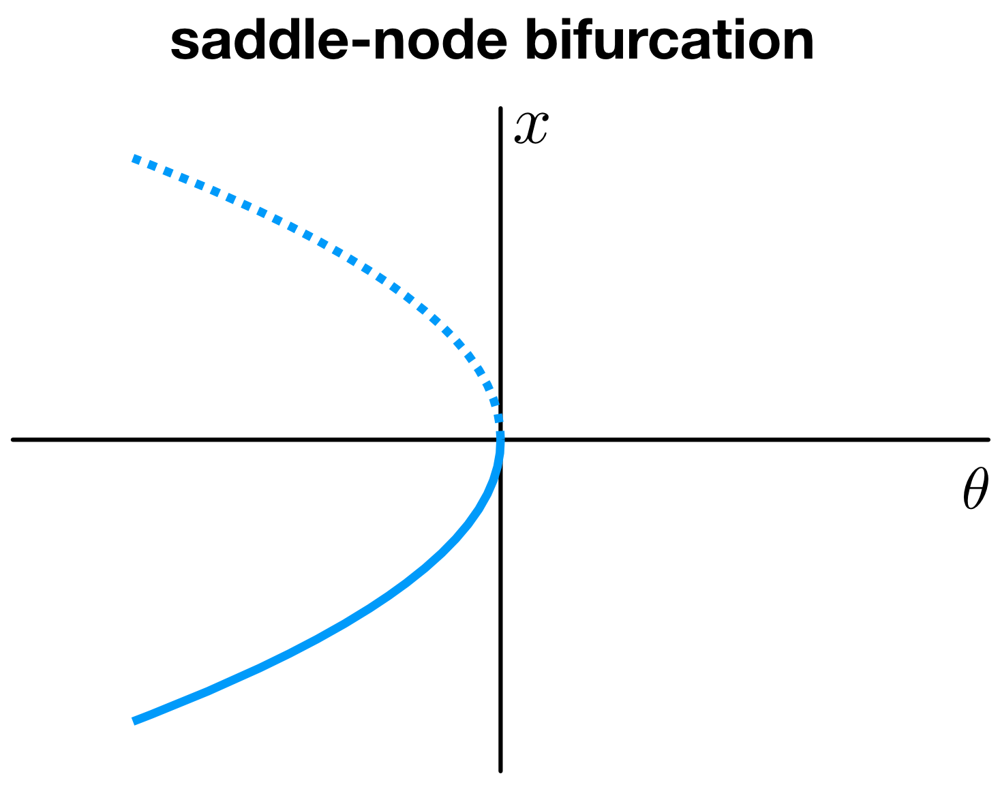

## Phase Portraits and Stability of Differential Equations in 2D 

- In 1D, all trajectories either move monotonically or remain constant.
<br><br>
- What happens in higher dimensions? 

### Two-Dimensional Systems

- In the exercise you were working with the Lotka-Volterra model for predator-prey dynamics of, e.g., hares (H) and foxes (F):
<br><br>
$$
\begin{align}
\frac{dH}{dt} &= \alpha H - \beta HF \\
\frac{dF}{dt} &= -\gamma F + \delta HF
\end{align}
$$
<br>
- We saw oscillations between the predator and prey population as well as extinction events.
<br><br>
- We’ll try to formalize in the following how to understand the behaviour of 2D models.

### Lotka-Volterra System 

.. and a small reminder of DifferentialEquations.jl

In [1]:
import Pkg 
Pkg.activate(".")
Pkg.add(["Plots", "DifferentialEquations"])
using Plots, DifferentialEquations 

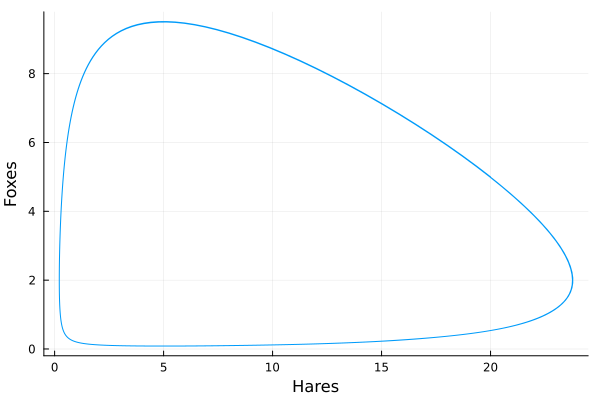

In [2]:
function lotka_volterra(x, p, t)
    H, F = x
    α, β, γ, δ = p
    return [α * H - β * H * F, -γ * F + δ * H * F]
end

x0 = [20.0, 5.0] 
tspan = (0.0, 20.0)

α = 1.0
β = 0.5
γ = 1.0
δ = 0.2
p = [α, β, γ, δ] 

prob = ODEProblem(lotka_volterra, x0, tspan, p)
sol = solve(prob)
plot(sol, idxs = (1, 2), xlabel = "Hares", ylabel = "Foxes", legend = false)

### 2D Phase Plots: Harmonic Oscillator 

- Let’s start with an easier system: the harmonic oscillator $m\ddot{x}+kx=0$.
<br><br>
- Letting $\dot x$ = $v$ and $\ddot x$ = $\dot v$ and converting to a first-order differential equation, we have
<br><br>
$$
\begin{align}
\frac{dx}{dt} &= v \\
\frac{dv}{dt} &= -\frac{k}{m} x,
\end{align}
$$
<br>
which is a linear system in two dimensions.
<br><br>
- We define the system in Julia and then plot the RHS as a vector field.

In [3]:
function harmonic_oscillator(u, p, t)
    m, k = p 
    x, v = u 
    dx = v 
    dv = - (k / m) * x 
    return [dx, dv]
end 

x0 = [1.0, 0.0]
tspan = (0.0, 100.0)
p = [1.0, 1.0]
prob = ODEProblem(harmonic_oscillator, x0, tspan, p)

ODEProblem with uType Vector{Float64} and tType Float64. In-place: false
Non-trivial mass matrix: false
timespan: (0.0, 100.0)
u0: 2-element Vector{Float64}:
 1.0
 0.0

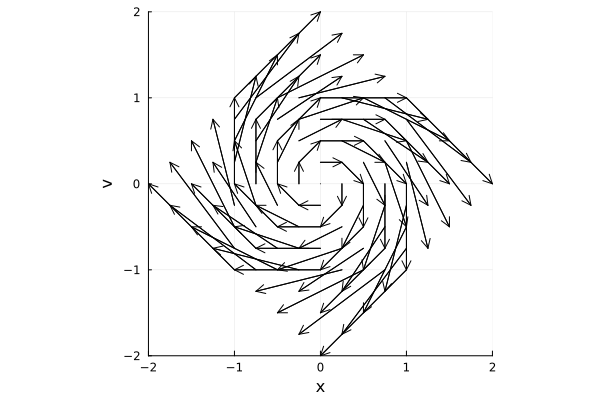

In [4]:
k = 1.0
m = 1.0

x_range = -1:0.25:1
v_range = -1:0.25:1

x = [x for x in x_range, v in v_range]
v = [v for x in x_range, v in v_range]
dx = v
dv = [- (k / m) * x for x in x_range, v in v_range]

fig = quiver(
    x, 
    v, 
    quiver = (dx, dv); 
    color = :black, 
    xlabel = "x", 
    ylabel = "v", 
    aspect_ratio = 1, 
    xlims = (-2, 2),
    ylims = (-2, 2),
)

- Trajectories will move along this vector field!
- When we add the trajectories in phase space, we get a **phase portrait**.
- The trajectories form **closed orbits**.
- The origin is a fixed point.

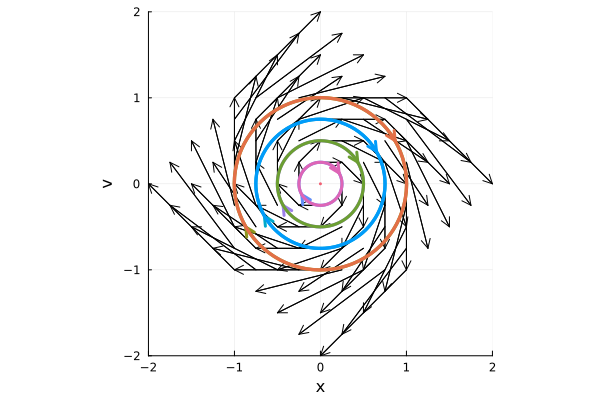

In [5]:
for u0 in [[x, 0] for x in x_range]  # release the harmonic oscillator from rest at various values of x
    prob = remake(prob, u0 = u0)  # syntactic sugar for creating a new ODEProblem object with different u0
    sol = solve(prob)
    plot!(
        fig,
        sol,
        idxs = (1, 2),
        arrows = true,
        legend = nothing,
        linewidth = 3,
        xlabel = "x",
        ylabel = "v",
    )
end
fig

### Analyzing 2D Systems Using Phase Portraits
- As long as the RHS is continuously differentiable, solutions always exist and are unique.
<br><br>
- This also implies that **trajectories never intersect** in phase portraits (solutions wouldn’t be unique if they would).
<br><br>
- We will look at another simple system:
<br><br>
$$
\begin{align}
\frac{dx}{dt} &= ax \\
\frac{dy}{dt} &= -y
\end{align}
$$
<br><br>
- This linear, uncoupled system can be straightforwardly solved analytically:
<br><br>
$$
\begin{align}
x(t) &= x_0 e^{at} \\
y(t) &= y_0 e^{-t}.
\end{align}
$$<br>
- However, for nonlinear equations it's typically impossible to find an analytical solution, hence why we use phase portraits to study their behaviour without actually solving them.

In [6]:
function f(u, p, t)
    a, = p
    x, y = u 
    return [a * x, -y]
end 

x0 = [1.0, 0.0]
tspan = (0.0, 2.0)
p = [-2.0]

prob = ODEProblem(f, x0, tspan, p)

ODEProblem with uType Vector{Float64} and tType Float64. In-place: false
Non-trivial mass matrix: false
timespan: (0.0, 2.0)
u0: 2-element Vector{Float64}:
 1.0
 0.0

### Stable Node 

* For $a<0$, we have a fixed point at the origin which is also called a **stable node** or sink.

In [7]:
function phase_plot(x_range, y_range, prob, p; kwargs...) 
    fig = plot(size = (500, 500))
    for x in x_range, y in y_range
        prob = remake(prob; u0 = [x, y], p = p)
        sol = solve(prob)
        plot!(
            fig,
            sol,
            idxs = (1, 2);
            arrows = true,
            legend = nothing,
            linewidth = 2,
            xlabel = "x",
            ylabel = "y",
            xlims = [-1, 1],
            ylims = [-1, 1],
            color = :black,
            kwargs...,
        )
    end    
    return fig
end 

phase_plot (generic function with 1 method)

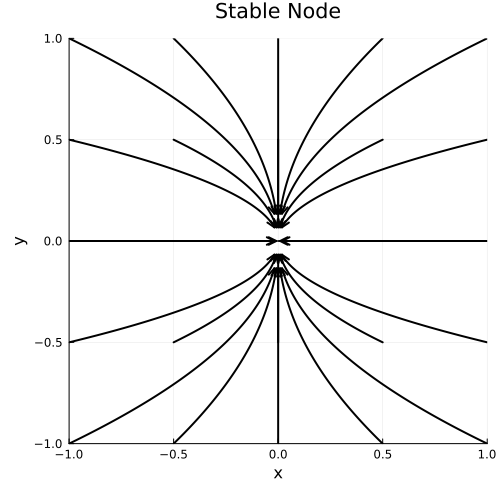

In [10]:
fig = phase_plot(
    -1:0.5:1,
    -1:0.5:1,
    prob,
    [-2];
    title = "Stable Node",
)

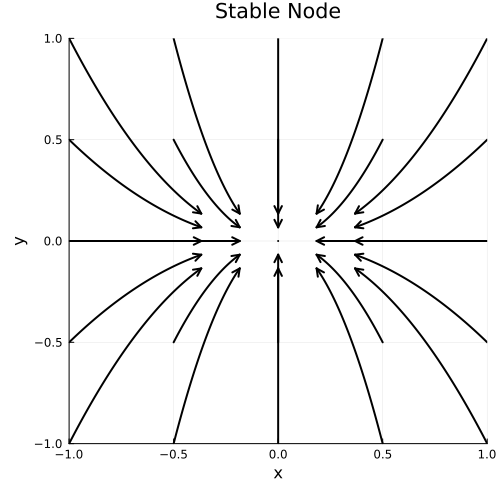

In [9]:
fig = phase_plot(
    -1:0.5:1,
    -1:0.5:1,
    prob,
    [-0.5];
    title = "Stable Node",
)

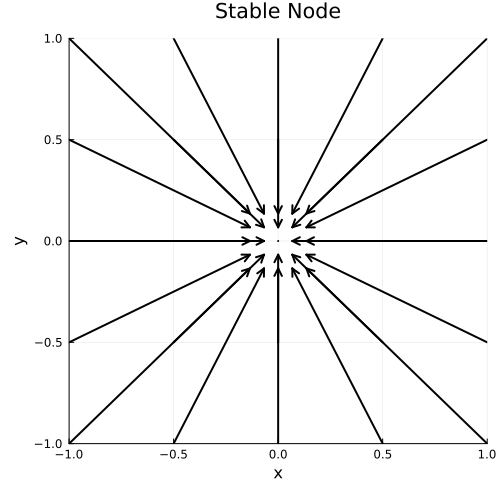

In [11]:
fig = phase_plot(
    -1:0.5:1,
    -1:0.5:1,
    prob,
    [-1];
    title = "Stable Node",
)

### Line of Fixed Points 
- For $a=0$, all points on the x-axis are stable fixed points.

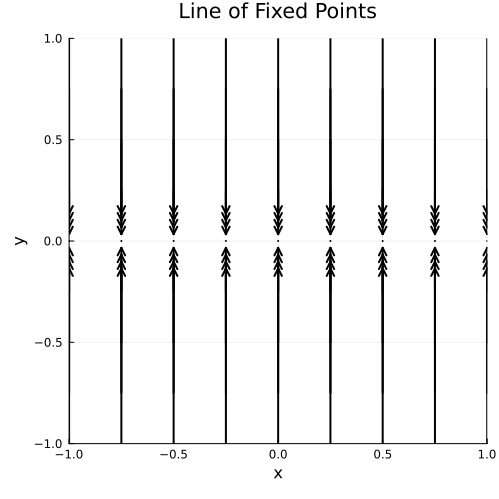

In [12]:
fig = phase_plot(
    -1:0.25:1,
    -1:0.25:1,
    prob,
    [0];
    title = "Line of Fixed Points"
)

### Saddle Point
- For $a>0$, we have a **saddle point**.

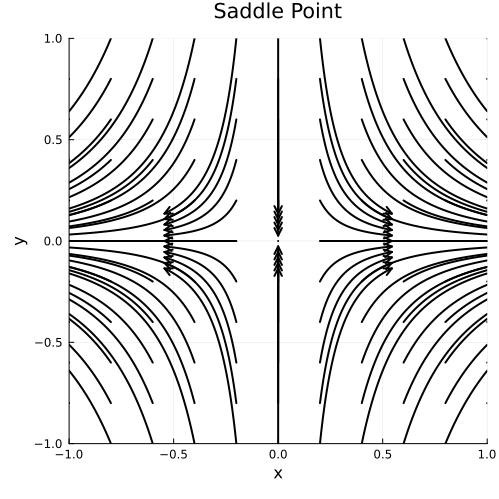

In [13]:
fig = phase_plot(
    -1:0.2:1, 
    -1:0.2:1, 
    prob, 
    [0.5];
    title = "Saddle Point",
)

- Here $\mathbf{x}^* = \mathbf{0}$ is called a *saddle point*.
<br><br>
- The $y$-axis is called the *stable manifold* of the saddle point $\mathbf{x}^*$, defined as the set of initial
conditions $\mathbf{x}_0$ such that $\mathbf{x}(t) \to \mathbf{x}^*$ as $t \to \infty$.
<br><br>
- Likewise, the *unstable manifold* of $\mathbf{x}^*$ is the set of initial conditions such that $\mathbf{x}(t) \to \mathbf{x}^*$ as $t \to -\infty$, in this case the $x$-axis.
<br><br>
- A typical trajectory asymptotically approaches the unstable manifold as $t \to \infty$, and approaches the stable manifold as $t \to -\infty$.

### Stability in 2D - The General (Linear) Case

- Close to their fixed points, nonlinear systems can be approximated by a linear system (as long as we don’t have an edge case similar to the discussion in 1D).
<br><br>
- Hence we will again study a linear system, this time in two dimensions:
<br><br>
$$
\frac{d}{dt}\begin{pmatrix}x \\ y\end{pmatrix} = \begin{pmatrix}a & b \\ c & b\end{pmatrix}\begin{pmatrix}x \\ y\end{pmatrix}
$$
<br>
- In matrix form, we have
<br><br>
$$
\frac{d\mathbf{x}}{dt} = \mathbf{A}{\mathbf{x}},
$$
<br>
where $\mathbf{A} = \begin{pmatrix}a & b \\ c & b\end{pmatrix}$ and $\mathbf{x} = \begin{pmatrix}x \\ y\end{pmatrix}$.
<br><br>
- Such a system is linear in the sense that if $\mathbf{x}_1$ and $\mathbf{x}_2$ are solutions, then so is any
linear combination $c_1\mathbf{x}_1 + c_2\mathbf{x}_2$.
<br><br>
- We look for solutions of the form $\mathbf{x}(t) = e^{\lambda t}\mathbf{v}$, where $\mathbf{v} \neq 0$ is some constant vector.
<br><br>
- When we substitute $\mathbf{x}(t)$ into the differential equation, we get an eigenvalue problem:
<br><br>
$$\mathbf{A}\mathbf{v}=\lambda\mathbf{v}.$$
<br>
- Eigenvalues $\lambda$ are given by the characteristic equation $\det(\mathbf{A}-\lambda\mathbf{1}) = 0$.
<br><br>
- It follows that:
<br><br>
$$
\begin{align}
\det(\mathbf{A}-\lambda\mathbf{1}) &= (a - \lambda)(d - \lambda) - cb = 0\\
&= \lambda^2 - \tau\lambda + \det(A) = 0
\end{align}
$$
<br>
where $\tau = \text{trace}(A) = a + d$ and $\det(A) = ad - bc$.
<br><br>
- Solving for $\lambda$, the eigenvalues are
<br><br>
$$\lambda_{1,2} = \frac{\tau\pm\sqrt{\tau^2 - 4\det(A)}}{2}.$$
<br>
- There are two eigenvalues and eigenvectors that form the general solution to the ODE:
<br><br>
$$\mathbf{x}(t)=c_1 e^{\lambda_1 t}\mathbf{v}_1 + c_2 e^{\lambda_2 t}\mathbf{v}_2$$
<br>
- The eigenvalues, their sign and whether or not they are real or complex determines the stability.
<br><br>
- This can be visualised in the Poincaré diagram that shows all possible phase portraits of linear 2D systems.

_(Figure from Freesodas via Wikipedia, CC BY-SA)_

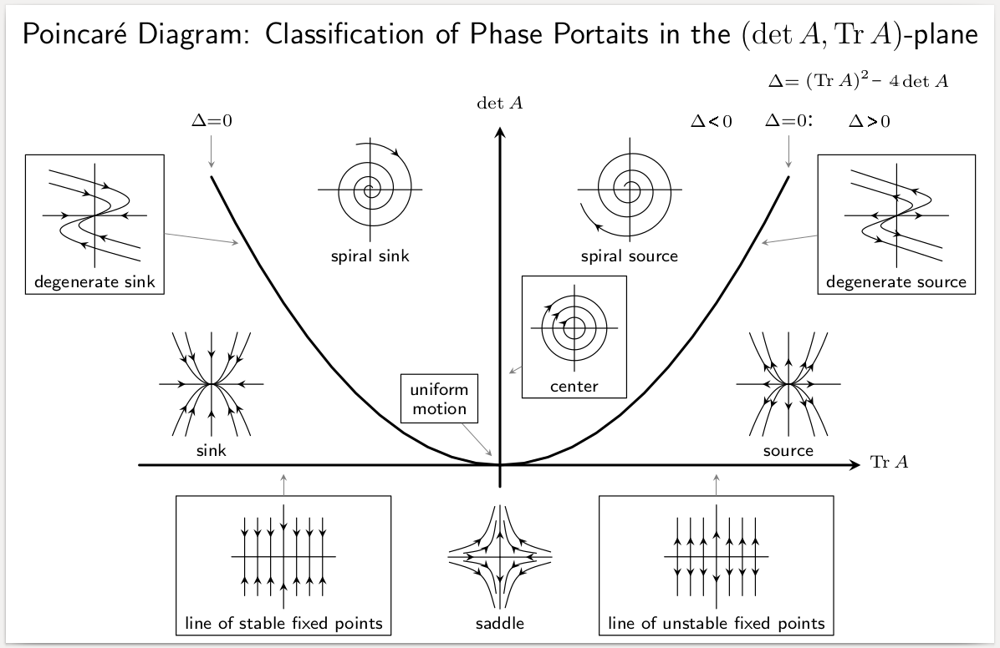

### Nonlinear 2D Systems 

- We can use the same classification for nonlinear systems with the general form:
<br>
$$\begin{align}
\frac{dx}{dt} &= f(x,y)\\
\frac{dy}{dt} &= g(x,y)
\end{align}
$$
- Linearizing, we get:
<br>
<br>
$$
\begin{align}
\frac{d}{dt}\begin{pmatrix}x \\ y\end{pmatrix} &= \begin{pmatrix}\frac{\partial f}{\partial x} & \frac{\partial f}{\partial y}\\\frac{\partial g}{\partial x} & \frac{\partial g}{\partial y}\end{pmatrix}
\begin{pmatrix}x\\y\end{pmatrix} + \mathcal{o}(x^2,y^2,xy)\\
&= \mathbf{J}\begin{pmatrix}x\\y\end{pmatrix} + \mathcal{o}(x^2,y^2,xy)
\end{align}
$$

- The linearization holds as long as $\mathcal{R}(\lambda)\neq 0$.

## Further Reading & Outlook
- Strogatz: “Nonlinear Dynamics and Chaos”
<br><br>
- Next Time: Chaos! 